# Part A: Hit or No Hit?
__Logistic regression__  models to determine if a song would be a hit in a given decade based on a bank of 5000+ songs

#### Run a preliminary logistic regression model to understand the coefficients of song attributes in merged dataset of all decades

In [153]:
# Logistic Regression
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [154]:
data60s = pd.read_csv('dataset-of-60s.csv')
data70s = pd.read_csv('dataset-of-70s.csv')
data80s = pd.read_csv('dataset-of-80s.csv')
data90s = pd.read_csv('dataset-of-90s.csv')
data00s = pd.read_csv('dataset-of-00s.csv')
data10s = pd.read_csv('dataset-of-10s.csv')

In [155]:
data60s['decade']=1960
data70s['decade']=1970
data80s['decade']=1980
data90s['decade']=1990
data00s['decade']=2000
data10s['decade']=2010

In [156]:
merged_data = pd.concat([data60s,data70s,data80s,data90s,data00s,data10s],axis=0)
merged_data['decade']=pd.to_datetime(merged_data['decade'], format='%Y')
merged_data

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,0.0779,0.8450,185.655,173533,3,32.94975,9,1,1960-01-01
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,0.1760,0.7970,101.801,213613,4,48.82510,10,0,1960-01-01
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,0.1190,0.9080,115.940,223960,4,37.22663,12,0,1960-01-01
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,0.0610,0.9670,105.592,157907,4,24.75484,8,0,1960-01-01
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,0.2130,0.9060,114.617,245600,4,21.79874,14,0,1960-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6393,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,0.3140,0.0361,72.272,150857,4,24.30824,7,0,2010-01-01
6394,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,0.2610,0.7400,119.985,152000,4,32.53856,8,1,2010-01-01
6395,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,0.1390,0.6050,119.999,227760,4,20.73371,7,1,2010-01-01
6396,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,0.1490,0.5600,120.030,213387,4,21.65301,14,0,2010-01-01


In [157]:
# Summary Statistics
merged_data.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,4.110600e+04,41106.000000,41106.000000,41106.000000,41106.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,119.338249,2.348776e+05,3.893689,40.106041,10.475673,0.500000
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,29.098845,1.189674e+05,0.423073,19.005515,4.871850,0.500006
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,97.397000,1.729278e+05,4.000000,27.599792,8.000000,0.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,117.565000,2.179070e+05,4.000000,35.850795,10.000000,0.500000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,136.494000,2.667730e+05,4.000000,47.625615,12.000000,1.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000


In [158]:
# shows that data is evenly split
merged_data['target'].value_counts()

1    20553
0    20553
Name: target, dtype: int64

/Users/myeon/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/myeon/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/myeon/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histogram

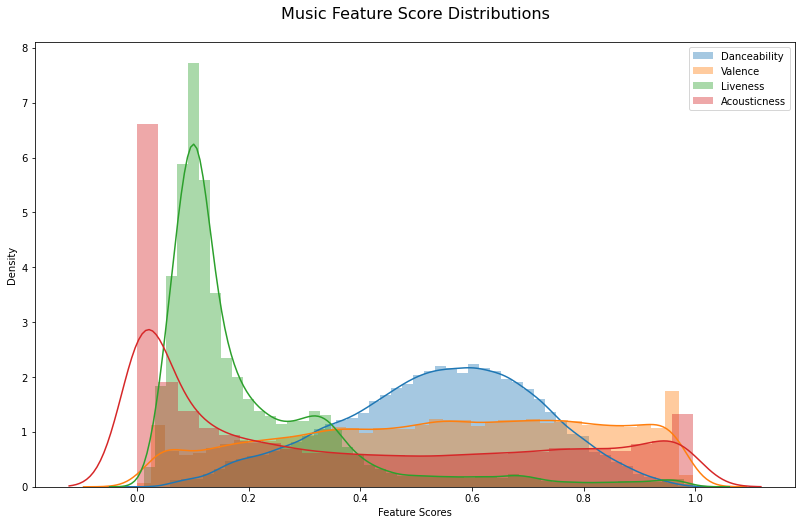

In [159]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(30,18))

loc1 = fig.add_subplot(2, 2, 1)

sns.distplot(merged_data['danceability'],ax=loc1,label='Danceability')
sns.distplot(merged_data['valence'],ax=loc1,label='Valence')
sns.distplot(merged_data['liveness'],ax=loc1,label='Liveness')
sns.distplot(merged_data['acousticness'],ax=loc1,label='Acousticness')


loc1.set_title("Music Feature Score Distributions\n",fontsize=16)
#loc2.set_title("Valence Score Distribution")
#loc3.set_title("Liveness Score Distribution")
#loc4.set_title("Acousticness Score Distribution")

plt.xlabel("Feature Scores")

plt.legend(loc='upper right',prop={'size':10})

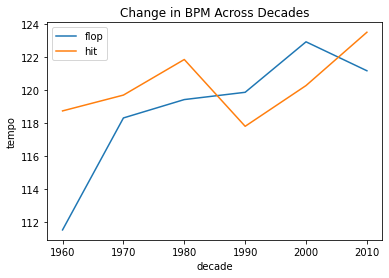

In [160]:
b=pd.DataFrame(merged_data.groupby(['decade','target'])['tempo'].mean())
b.reset_index(inplace=True)
sns.lineplot(data=b,x='decade',y='tempo',hue='target')

plt.title('Change in BPM Across Decades')
plt.legend(['flop','hit'])

In [161]:
#Logistic Regression model on merged decade data to understand audio feature coefficients
import statsmodels.formula.api as smf

LR_results = smf.logit('target ~ danceability + energy + key + loudness + mode + speechiness + acousticness + instrumentalness + liveness + valence + tempo + time_signature + chorus_hit', data=merged_data).fit()
                       
LR_results.summary()

Optimization terminated successfully.
         Current function value: 0.528021
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 target   No. Observations:                41106
Model:                          Logit   Df Residuals:                    41092
Method:                           MLE   Df Model:                           13
Date:                Mon, 17 Oct 2022   Pseudo R-squ.:                  0.2382
Time:                        19:31:51   Log-Likelihood:                -21705.
converged:                       True   LL-Null:                       -28493.
Covariance Type:            nonrobust   LLR p-value:                     0.000
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.3055      0.172      1.773      0.076      -0.032       0.643
danceability         3.2587      0.092     35.318      0.000       3.078       3.440
energy              -1.9581      0.100    -19.658      0.000      -2.153      -1.763
key                  0.0100      0.003      3.010      0.003       0.004       0.017
loudness             0.1098      0.004     24.948      0.000       0.101       0.118
mode                 0.3989      0.026     15.280      0.000       0.348       0.450
speechiness         -3.1918      0.156    -20.397      0.000      -3.499      -2.885
acousticness        -1.3687      0.053    -26.035      0.000      -1.472      -1.266
instrumentalness    -3.3871      0.067    -50.444      0.000      -3.519      -3.255
liveness            -0.2066      0.069     -2.984      0.003      -0.342      -0.071
valence              0.4249      0.059      7.214      0.000       0.309       0.540
tempo                0.0020      0.000      4.715      0.000       0.001       0.003
time_signature       0.1386      0.032      4.341      0.000       0.076       0.201
chorus_hit          -0.0021      0.001     -3.314      0.001      -0.003      -0.001
====================================================================================
"""

In [162]:
# odds ratio to calculate most influential factors
odds_ratio = np.exp(LR_results.params)
odds_ratio

Intercept            1.357260
danceability        26.015676
energy               0.141125
key                  1.010091
loudness             1.116054
mode                 1.490145
speechiness          0.041097
acousticness         0.254442
instrumentalness     0.033808
liveness             0.813380
valence              1.529481
tempo                1.001997
time_signature       1.148612
chorus_hit           0.997882
dtype: float64

#### Logistic Regression Model Building

In [163]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.datasets import load_digits
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [164]:
# Upload all decade song data files
data60s = pd.read_csv('dataset-of-60s.csv')
data70s = pd.read_csv('dataset-of-70s.csv')
data80s = pd.read_csv('dataset-of-80s.csv')
data90s = pd.read_csv('dataset-of-90s.csv')
data00s = pd.read_csv('dataset-of-00s.csv')
data10s = pd.read_csv('dataset-of-10s.csv')

In [165]:
# Drop non-numeric data 
data60s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols
data70s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols
data80s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols
data90s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols
data00s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols
data10s.drop(['track', 'artist', 'uri','chorus_hit','sections'], axis=1, inplace=True) #13 cols


unscaled_data60 = data60s.iloc[:,0:-1]
unscaled_data70 = data70s.iloc[:,0:-1]
unscaled_data80 = data80s.iloc[:,0:-1]
unscaled_data90 = data90s.iloc[:,0:-1]
unscaled_data00 = data00s.iloc[:,0:-1]
unscaled_data10 = data10s.iloc[:,0:-1]


target60 = data60s.iloc[:,[-1]] # all rows 
target70 = data70s.iloc[:,[-1]] # all rows 
target80 = data80s.iloc[:,[-1]] # all rows 
target90 = data90s.iloc[:,[-1]] # all rows 
target00 = data00s.iloc[:,[-1]] # all rows 
target10 = data10s.iloc[:,[-1]] # all rows 

In [166]:
# Split dataset into train, validate and test sets
num_samples60 = unscaled_data60.shape[0]
num_samples70 = unscaled_data70.shape[0]
num_samples80 = unscaled_data80.shape[0]
num_samples90 = unscaled_data90.shape[0]
num_samples00 = unscaled_data00.shape[0]
num_samples10 = unscaled_data10.shape[0]


num_train_samples60 = int(0.8*num_samples60)
num_train_samples70 = int(0.8*num_samples70)
num_train_samples80 = int(0.8*num_samples80)
num_train_samples90 = int(0.8*num_samples90)
num_train_samples00 = int(0.8*num_samples00)
num_train_samples10 = int(0.8*num_samples10)


num_validation_samples60 = int(0.1*num_samples60) # for more accuracy
num_validation_samples70 = int(0.1*num_samples70) # for more accuracy
num_validation_samples80 = int(0.1*num_samples80) # for more accuracy
num_validation_samples90 = int(0.1*num_samples90) # for more accuracy
num_validation_samples00 = int(0.1*num_samples00) # for more accuracy
num_validation_samples10 = int(0.1*num_samples10) # for more accuracy


num_test_samples60 = num_samples60 - num_train_samples60 - num_validation_samples60
num_test_samples70 = num_samples70 - num_train_samples70 - num_validation_samples70
num_test_samples80 = num_samples80 - num_train_samples80 - num_validation_samples80
num_test_samples90 = num_samples90 - num_train_samples90 - num_validation_samples90
num_test_samples00 = num_samples00 - num_train_samples00 - num_validation_samples00
num_test_samples10 = num_samples10 - num_train_samples10 - num_validation_samples10

In [167]:
# Train data set 
train_predictors60 = unscaled_data60[:num_train_samples60]
train_predictors70 = unscaled_data70[:num_train_samples70]
train_predictors80 = unscaled_data80[:num_train_samples80]
train_predictors90 = unscaled_data90[:num_train_samples90]
train_predictors00 = unscaled_data00[:num_train_samples00]
train_predictors10 = unscaled_data10[:num_train_samples10]



train_targets60 = target60[:num_train_samples60]
train_targets70 = target70[:num_train_samples70]
train_targets80 = target80[:num_train_samples80]
train_targets90 = target90[:num_train_samples90]
train_targets00 = target00[:num_train_samples00]
train_targets10 = target10[:num_train_samples10]

In [168]:
# Test data set
test_predictors60 = unscaled_data60[num_train_samples60+num_validation_samples60:]
test_predictors70 = unscaled_data70[num_train_samples70+num_validation_samples70:]
test_predictors80 = unscaled_data80[num_train_samples80+num_validation_samples80:]
test_predictors90 = unscaled_data90[num_train_samples90+num_validation_samples90:]
test_predictors00 = unscaled_data00[num_train_samples00+num_validation_samples00:]
test_predictors10 = unscaled_data10[num_train_samples10+num_validation_samples10:]

test_targets60 = target60[num_train_samples60+num_validation_samples60:]
test_targets70 = target70[num_train_samples70+num_validation_samples70:]
test_targets80 = target80[num_train_samples80+num_validation_samples80:]
test_targets90 = target90[num_train_samples90+num_validation_samples90:]
test_targets00 = target00[num_train_samples00+num_validation_samples00:]
test_targets10 = target10[num_train_samples10+num_validation_samples10:]

In [169]:
# Standardize predictor training data
scaler = StandardScaler()

x_train60 = scaler.fit_transform(train_predictors60)
x_test60 = scaler.transform(test_predictors60)

x_train70 = scaler.fit_transform(train_predictors70)
x_test70 = scaler.transform(test_predictors70)

x_train80 = scaler.fit_transform(train_predictors80)
x_test80 = scaler.transform(test_predictors80)

x_train90 = scaler.fit_transform(train_predictors90)
x_test90 = scaler.transform(test_predictors90)

x_train00 = scaler.fit_transform(train_predictors00)
x_test00 = scaler.transform(test_predictors00)

x_train10 = scaler.fit_transform(train_predictors10)
x_test10 = scaler.transform(test_predictors10)

### Evaluation of Logistic Regression Models

In [170]:
# Define function to calculate LR model evaluation metrics
def evaluate_model(test_targets, y_pred, year):
    p_score = precision_score(test_targets, y_pred)
    r_score = recall_score(test_targets, y_pred)
    f1 = f1_score(test_targets, y_pred)
    cfmatrix = confusion_matrix(test_targets, y_pred)
    print('For ' , year, ': ', 'Confusion matrix: ', cfmatrix, ', Precision score: ', p_score, ', R Score:  ', r_score, ', F1 score: ', f1)
    

In [171]:
# Training data model accuracy
def test_accuracy(model):
    print("Here are the accuracy scores for all decades: \n")
    trainaccuracyscores = [(model.score(x_train60, train_targets60)),
                       (model.score(x_train70, train_targets70)),
                        (model.score(x_train80, train_targets80)),
                         (model.score(x_train90, train_targets90)),
                          (model.score(x_train00, train_targets00)),
                           (model.score(x_train10, train_targets10))]

    trainaccuracyscores=pd.DataFrame(trainaccuracyscores,index=[1960,1970,1980,1990,2000,2010])
    trainaccuracyscores.columns=['\n LR Model Training Data Accuracy Scores']
    print(trainaccuracyscores)
    
    # Test data model accuracy
    testaccuracyscores = [(model.score(x_test60, test_targets60)),
                       (model.score(x_test70, test_targets70)),
                        (model.score(x_test80, test_targets80)),
                         (model.score(x_test90, test_targets90)),
                          (model.score(x_test00, test_targets00)),
                           (model.score(x_test10, test_targets10))]
    testaccuracyscores=pd.DataFrame(testaccuracyscores,index=[1960,1970,1980,1990,2000,2010])
    testaccuracyscores.columns=['\n LR Model Test Data Accuracy Scores \n']
    print(testaccuracyscores)
    
    y_pred60 = model.predict(x_test60)
    evaluate_model(test_targets60, y_pred60, '1960') #evaluate 1960s model
    y_pred70 = model.predict(x_test70)
    evaluate_model(test_targets70, y_pred70, '1970')
    y_pred80 = model.predict(x_test80)
    evaluate_model(test_targets80, y_pred80, '1980')
    y_pred90 = model.predict(x_test90)
    evaluate_model(test_targets90, y_pred90, '1990')
    y_pred00 = model.predict(x_test00)
    evaluate_model(test_targets00, y_pred00, '2000')
    y_pred10 = model.predict(x_test10)
    evaluate_model(test_targets10, y_pred10, '2010')

# Similar Song Recommendations Generator
### KNN model to create a playlist based on user song choice

In [172]:
#Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [173]:
#Import data of all decades
data60s = pd.read_csv('dataset-of-60s.csv')
data70s = pd.read_csv('dataset-of-70s.csv')
data80s = pd.read_csv('dataset-of-80s.csv')
data90s = pd.read_csv('dataset-of-90s.csv')
data00s = pd.read_csv('dataset-of-00s.csv')
data10s = pd.read_csv('dataset-of-10s.csv')

In [174]:
#Add column to each dataset identify decade of data
data60s['decade']=1960
data70s['decade']=1970
data80s['decade']=1980
data90s['decade']=1990
data00s['decade']=2000
data10s['decade']=2010

In [175]:
#Merge 6 decade datasets into one single dataframe
merged_data = pd.concat([data60s,data70s,data80s,data90s,data00s,data10s],axis=0)
merged_data

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,0.0779,0.8450,185.655,173533,3,32.94975,9,1,1960
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,0.1760,0.7970,101.801,213613,4,48.82510,10,0,1960
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,0.1190,0.9080,115.940,223960,4,37.22663,12,0,1960
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,0.0610,0.9670,105.592,157907,4,24.75484,8,0,1960
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,0.2130,0.9060,114.617,245600,4,21.79874,14,0,1960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6393,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,0.3140,0.0361,72.272,150857,4,24.30824,7,0,2010
6394,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,0.2610,0.7400,119.985,152000,4,32.53856,8,1,2010
6395,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,0.1390,0.6050,119.999,227760,4,20.73371,7,1,2010
6396,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,0.1490,0.5600,120.030,213387,4,21.65301,14,0,2010


In [176]:
#Convert decade to date-time format
merged_data['decade']=pd.to_datetime(merged_data['decade'], format='%Y')

#Drop non-numeric columns 
merged_data2=merged_data.drop(columns=['track','artist','uri','decade'])

#Convert dataframe to list of lists where one row of dataframe is a list entry
merged_data_list=merged_data2.values.tolist()
merged_data_list

# Input Spotify dataset
data = merged_data_list

In [177]:
#Import Spotify packages
import os
os.environ['SPOTIPY_CLIENT_ID'] = '12a274d91fb54d6f95f9ab4589be1d48'
os.environ['SPOTIPY_CLIENT_SECRET'] ='1adab3171d2a4dab99e4114f462a965d'

In [178]:
#Import Spotify web API tools
import spotipy
import ssl 
ssl._create_default_https_context = ssl._create_unverified_context
from spotipy.oauth2 import SpotifyClientCredentials

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="12a274d91fb54d6f95f9ab4589be1d48",
                                                           client_secret="1adab3171d2a4dab99e4114f462a965d"))

Nearest neighbor derivation functions source from: #https://machinelearningmastery.com/tutorial-to-implement-k-nearest-neighbors-in-python-from-scratch/


In [179]:
#Create list of song recommendations based on matching criteria
def create_list(song_recommendations):
    mylist = []

    for i in range(0,len(song_recommendations)):
        mylist.append(merged_data.index[(merged_data['danceability'] == song_recommendations[i][0]) & (merged_data['energy'] == song_recommendations[i][1])
        & (merged_data['key'] == song_recommendations[i][2]) & (merged_data['loudness'] == song_recommendations[i][3])   
        & (merged_data['mode'] == song_recommendations[i][4]) & (merged_data['speechiness'] == song_recommendations[i][5])
        & (merged_data['acousticness'] == song_recommendations[i][6]) & (merged_data['instrumentalness'] == song_recommendations[i][7])        
        & (merged_data['liveness'] == song_recommendations[i][8]) & (merged_data['valence'] == song_recommendations[i][9])                   
        & (merged_data['tempo'] == song_recommendations[i][10]) & (merged_data['duration_ms'] == song_recommendations[i][11])
        & (merged_data['time_signature'] == song_recommendations[i][12]) & (merged_data['chorus_hit'] == song_recommendations[i][13])                   
        & (merged_data['sections'] == song_recommendations[i][14]).tolist()])
    
    #Return playlist of k song recommendations to user 
    print('\nCreating playlist of similar songs...\n')
    df = pd.DataFrame()
    for i in range(0,len(mylist)):
        df=df.append(merged_data.iloc[mylist[i]])
    df.reset_index(inplace=True)
    df.drop(columns=['index'],inplace=True)

    print(df[['artist','track']])

In [180]:
 # Euclidean distance between two songs
from math import sqrt

def prox(song1, song2):
    dist = 0.0
    for i in range(len(song1)-1):
        dist += (song1[i] - song2[i])**2
    return sqrt(dist)
 
# Identify nearest neighbor songs by Euclidean distance of numerical data features
def find_recs(dataset, input_song, num_recs):
    distances = list()
    for song_entry in dataset:
        dist = prox(input_song, song_entry)
        distances.append((song_entry, dist))
    distances.sort(key=lambda tup: tup[1])
    recommendations = list()
    for i in range(num_recs):
        recommendations.append(distances[i][0])
    create_list(recommendations)

In [181]:
def k_entry(songchoice):
    i=0
    while i ==0:
        #Select number of song recommendations preferred
        k_input=int(input('\nPlease enter how many recommendations you want: '))
        # Input new song with 16 numerical features
        if k_input>0:
            find_recs(data, songchoice, k_input)            
            i=1
        elif k_input<=0:
            print("Please enter a positive number.")

In [182]:
#Extract songs from Spotify API

def get_features2(track_link):
    featurelist = sp.audio_features(tracks=[track_id])
    ftvalues = featurelist[0].values()
    ftvalues_list = list(ftvalues)

    #Convert dictionary's values to a list
    dnce = ftvalues_list[0]
    enrg = ftvalues_list[1]
    ky = ftvalues_list [2]
    ldns = ftvalues_list[3]
    mde = ftvalues_list[4]
    spch = ftvalues_list[5]
    acst = ftvalues_list[6]
    instr = ftvalues_list[7]
    livne = ftvalues_list[8]
    val = ftvalues_list[9]
    tmp = ftvalues_list[10]
    dur = ftvalues_list[16]
    ts = ftvalues_list[17]    
    songfeatures = (dnce, enrg, ky, ldns, mde, spch, acst,instr, livne, val,tmp, dur, ts) 
    k_entry(songfeatures) # call next function

In [183]:
# function to choose song
def songchoosing():
    songnamelist = []
    chosentrack = input('\nInput the name of a song by your chosen artist on Spotify: ') 

    results = sp.search(q=chosentrack, limit=1)
    for track in results['tracks']['items']:
        track_id = track['uri']
        print('\nYour Song Choice: ', track['name'])
        songnamelist.append(chosentrack)
        if not songnamelist:
            print("\nPlease enter a valid song name by your chosen artist.")
        else:
            satisfied = input('\n Are you satisfied with ' + track['name'] + ' as your song selection? [Y/N]\n') 
            get_features2(track_id) # call next function
            while satisfied == 'N':
                songchoosing()

In [184]:
# function for user to decide if they want to use the kNN function or end the service here
def goToRec():
    userinput = input("\nWould you like to find similar songs to this song? (Y/N)")
    if userinput in ('Y', 'y'): 
        print("\nWelcome to our song recommender! This service is useful if you desire to find another song that gives you the same magical feeling of the song you input!")
        songchoosing()
    else: 
        print('\n Thank you for using our service! Have a great day.')

#### Import Spotify API tools

In [185]:
### Spotify API requests using spotipy module
import os
os.environ['SPOTIPY_CLIENT_ID'] = '12a274d91fb54d6f95f9ab4589be1d48'
os.environ['SPOTIPY_CLIENT_SECRET'] ='1adab3171d2a4dab99e4114f462a965d'

import spotipy
import ssl 
ssl._create_default_https_context = ssl._create_unverified_context
from spotipy.oauth2 import SpotifyClientCredentials

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="2bc5d2c4e68844ab976fe5b78cc58ec4",
                                                           client_secret="27ec23d050e44067b9b3914d75f192ed"))

In [186]:
# Create function to train and predict with LR model
def buildModel(train,label,songfeatures, yearinput):
    model = LogisticRegression(solver='liblinear', C=0.05, multi_class='ovr',
                           random_state=0)
    model.fit(train, label)
    # call function to evaluate here
    x_test_new = scaler.transform(songfeatures)
    #Make prediction of hit or not
    hit_pred = model.predict(x_test_new)
    #Return hit or no hit response to user
    if hit_pred == 0: 
        print ('\nSorry! Your song would not be a hit in the ' + str(yearinput) + 's.')
        ask = input('Would you like to try a different year? (Y/N)')
        if ask in ('Y', 'y'): 
            yearinput=input("Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if your song would be a hit or not in that decade: \n\n")
            getYear(yearinput, songfeatures)
        else:
            accuracytest = input('Would you like to test the accuracy of this result? (Y/N)')
            if accuracytest in ('Y', 'y'):
                print('\ntesting accuracy of the model....')
                test_accuracy(model)
                goToRec()
            else:
                goToRec()
    else: 
        print ('\nCongratulations! Your song would be a hit in the ' + str(yearinput) + 's.')
        ask = input('Would you like to try a different year? (Y/N)')
        if ask in ('Y', 'y'): 
            yearinput=input("Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if your song would be a hit or not in that decade: \n\n")
            getYear(yearinput, songfeatures)
        else:
            accuracytest = input('Would you like to test the accuracy of our prediction model? (Y/N)')
            if accuracytest in ('Y', 'y'):
                print('\ntesting accuracy of the model....')
                test_accuracy(model)
                goToRec()
            else:
                goToRec()

In [187]:
# Prompt user for decade of choice to base song hit evaluation off of
def getYear(yearinput, songfeatures):
    songfeatures=np.array(songfeatures)
    songfeatures=songfeatures.reshape(1, -1)
        # Run LR model for year chosen
    if yearinput == '1960':
        buildModel(x_train60,train_targets60, songfeatures, yearinput)
    elif yearinput == '1970':
        buildModel(x_train70,train_targets70, songfeatures, yearinput)
    elif yearinput == '1980':
        buildModel(x_train80,train_targets80, songfeatures, yearinput)
    elif yearinput == '1990':
        buildModel(x_train90,train_targets90, songfeatures, yearinput)
    elif yearinput == '2000':
        buildModel(x_train00,train_targets00, songfeatures, yearinput)
    elif yearinput == '2010':
        buildModel(x_train10,train_targets10, songfeatures, yearinput)
    else: 
        print('\nCannot recognize year. Try again')
        yearinput=input("Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if the song would be a hit or not in that decade: \n\n")
        getYear(yearinput, songfeatures)

In [188]:
# function to graph song on plot of danceability and loudness, and show user where inputted 
def graph_song(songfeatures):
    import plotly.express as px
    dnce = songfeatures[0]
    ldns = songfeatures[3]
    df2=pd.DataFrame({'dnce':[dnce],'ldns':[ldns]})
    df = merged_data
    fig1 = px.scatter(df, x='danceability', y='loudness', size='valence', size_max = 30, color = 'target', opacity = .30, hover_data=['decade', 'mode'], title = 'Hit vs Flop, where Yellow = Hit')
    fig1.show()
    fig2 = px.scatter(df, x='danceability', y='loudness', size='valence', size_max = 30, color = 'target', opacity = .01, hover_data=['decade', 'mode'], title = "Where your Song Falls on the Hit vs Flop Chart")
    # fig2.add_scatter(x = [0.4], y=[-10], size_max = 80, mode="markers")
    yourfig = fig2.add_scatter(x = df2['dnce'], y = df2['ldns'], mode="markers",
                    marker=dict(size=40, color="Red"),
                    name="Your Song Here")
    yourfig.show()
    yearinput=input("Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if the song would be a hit or not in that decade: \n\n")
    getYear(yearinput, songfeatures)


In [189]:
# Function to pull features from songs on Spotify
def get_features(track_id):
    featurelist = sp.audio_features(tracks=[track_id])
    ftvalues = featurelist[0].values()
    ftvalues_list = list(ftvalues)

    #Convert dictionary's values to a list
    dnce = ftvalues_list[0]
    enrg = ftvalues_list[1]
    ky = ftvalues_list [2]
    ldns = ftvalues_list[3]
    mde = ftvalues_list[4]
    spch = ftvalues_list[5]
    acst = ftvalues_list[6]
    instr = ftvalues_list[7]
    livne = ftvalues_list[8]
    val = ftvalues_list[9]
    tmp = ftvalues_list[10]
    dur = ftvalues_list[16]
    ts = ftvalues_list[17]
    songfeatures = [dnce, enrg, ky, ldns, mde, spch, acst, instr, livne, val, tmp, dur, ts]
    graph_song(songfeatures)

In [190]:
# the final, only code that run - all inputs will be prompted with this block. 
print("Hello! Welcome to the Song Hit Predictor! This program allows you to input any song on Spotify's database, and we'll tell you if your song would've been a hit or not in a certain decade of your choosing.\n")

searchorenter = input('Would you like to search for your song or enter a link? (S or L)')
if searchorenter in ('S','s'): 
    artistquery = input('Enter artist name to search for track: ')

    results = sp.search(q=artistquery, limit=10)
    for idx, track in enumerate(results['tracks']['items']):
        print(idx, track['name'])


    chosentrack = input('\nInput your song choice: ') 

    results = sp.search(q=chosentrack, limit=1)
    for idx, track in enumerate(results['tracks']['items']):
        track_id = track['uri']
        print('\nYou chose this song: ', track['name'])
        print('Analyzing and comparing "' + track['name'] + '" in our database of hits vs flops..... \n')
        get_features(track_id)

elif searchorenter in ('L', 'l'):
    url = input("\nEnter a link to your song: ")
    track = sp.track(url)
    print('\nYou chose this song: ' +  track['name'])
    print('Analyzing and comparing "' + track['name'] + '" in our database of hits vs flops..... \n')
    uri = track['uri']
    get_features(uri)
else: 
    print("\nPlease re-run code and enter S or L")

Hello! Welcome to the Song Hit Predictor! This program allows you to input any song on Spotify's database, and we'll tell you if your song would've been a hit or not in a certain decade of your choosing.

Would you like to search for your song or enter a link? (S or L)s
Enter artist name to search for track: bts
0 Bad Decisions (with BTS & Snoop Dogg)
1 Left and Right (Feat. Jung Kook of BTS)
2 Butter
3 Dynamite
4 Yet To Come
5 Run BTS
6 Boy With Luv (feat. Halsey)
7 Rush Hour (Feat. j-hope of BTS)
8 FAKE LOVE
9 BTS Cypher 4

Input your song choice: fake love

You chose this song:  Fake Love
Analyzing and comparing "Fake Love" in our database of hits vs flops..... 



Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if the song would be a hit or not in that decade: 

1960


/Users/myeon/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/myeon/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:445: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names




Sorry! Your song would not be a hit in the 1960s.
Would you like to try a different year? (Y/N)y
Choose a decade (1960, 1970, 1980, 1990, 2000, or 2010) to see if your song would be a hit or not in that decade: 

2010


/Users/myeon/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/myeon/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:445: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names




Congratulations! Your song would be a hit in the 2010s.
Would you like to try a different year? (Y/N)n
Would you like to test the accuracy of our prediction model? (Y/N)y

testing accuracy of the model....
Here are the accuracy scores for all decades: 

      \n LR Model Training Data Accuracy Scores
1960                                   0.661941
1970                                   0.666613
1980                                   0.688382
1990                                   0.744339
2000                                   0.819885
2010                                   0.801876
      \n LR Model Test Data Accuracy Scores \n
1960                                  0.682081
1970                                  0.656812
1980                                  0.703757
1990                                  0.724638
2000                                  0.831633
2010                                  0.798752
For  1960 :  Confusion matrix:  [[267 161]
 [114 323]] , Precision score:  0.667